In [1]:
from ISR.models import RRDN
from ISR.models import Discriminator
from ISR.models import Cut_VGG19
from ISR.train import Trainer
import os
import numpy as np
from PIL import Image

In [2]:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [3]:
import tensorflow as tf
tf.test.is_gpu_available()

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


True

In [4]:
tf.__version__

'2.1.0'

In [5]:
lr_train_patch_size = 60
layers_to_extract = [5, 9]
scale = 4
hr_train_patch_size = lr_train_patch_size * scale

In [ ]:
rrdn  = RRDN(weights="gans", arch_params={'C':4, 'D':3, 'G':32, 'G0':32, 'T': 10, 'x':scale}, patch_size=lr_train_patch_size)

In [13]:
f_ext = Cut_VGG19(patch_size=hr_train_patch_size, layers_to_extract=layers_to_extract)
discr = Discriminator(patch_size=hr_train_patch_size, kernel_size=3)

In [5]:
!nvidia-smi

Tue Mar  9 09:47:26 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 418.87.00    Driver Version: 418.87.00    CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:02:00.0 Off |                    0 |
| N/A   42C    P0    32W / 250W |    265MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
|   1  Tesla P100-PCIE...  Off  | 00000000:81:00.0 Off |                    0 |
| N/A   39C    P0    28W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
        

In [6]:
import numpy as np
from PIL import Image
import os
img = Image.open('train_data/input/0001.png')
lr_img = np.array(img)

In [16]:
1/12.75

0.0784313725490196

In [17]:
loss_weights = {
  'generator': 0.0,
  'feature_extractor': 0.0833,
  'discriminator': 0.01
}

losses = {
  'generator': 'mae',
  'feature_extractor': 'mse',
  'discriminator': 'binary_crossentropy'
} 

log_dirs = {'logs': './logs', 'weights': './weights'}

learning_rate = {'initial_value': 0.0004, 'decay_factor': 0.5, 'decay_frequency': 900}

flatness = {'min': 0.0, 'max': 0.15, 'increase': 0.01, 'increase_frequency': 5}

trainer = Trainer(
    generator=rrdn,
    discriminator=discr,
    feature_extractor=f_ext,
    lr_train_dir='train_data/input/',
    hr_train_dir='train_data/target/',
    lr_valid_dir='val_data/input/',
    hr_valid_dir='val_data/target/',
    loss_weights=loss_weights,
    learning_rate=learning_rate,
    flatness=flatness,
    dataname='spainai',
    log_dirs=log_dirs,
    weights_generator=None,
    weights_discriminator=None,
    n_validation=100,
)

In [18]:
trainer.train(
    epochs=10,
    steps_per_epoch=57,
    batch_size=16,
    monitored_metrics={'val_generator_PSNR_Y': 'max'}
)


Training details:
  training_parameters: 
    lr_train_dir: train_data/input/
    hr_train_dir: train_data/target/
    lr_valid_dir: val_data/input/
    hr_valid_dir: val_data/target/
    loss_weights: {'generator': 0.0, 'feature_extractor': 0.0833, 'discriminator': 0.01}
    log_dirs: {'logs': './logs', 'weights': './weights'}
    fallback_save_every_n_epochs: 2
    dataname: spainai
    n_validation: 100
    flatness: {'min': 0.0, 'max': 0.15, 'increase': 0.01, 'increase_frequency': 5}
    learning_rate: {'initial_value': 0.0004, 'decay_factor': 0.5, 'decay_frequency': 900}
    adam_optimizer: {'beta1': 0.9, 'beta2': 0.999, 'epsilon': None}
    losses: {'generator': 'mae', 'discriminator': 'binary_crossentropy', 'feature_extractor': 'mse'}
    metrics: {'generator': <function PSNR_Y at 0x7f9c096737a0>}
    lr_patch_size: 60
    steps_per_epoch: 57
    batch_size: 16
    starting_epoch: 0
  generator: 
    name: rrdn
    parameters: {'C': 4, 'D': 3, 'G': 32, 'G0': 32, 'x': 4, 'T': 10

100%|██████████| 57/57 [02:37<00:00,  2.76s/it]
Epoch 0 took      157.4s


1600/1600 [==============================] - 59s 37ms/sample - loss: 0.1834 - generator_loss: 0.0361 - discriminator_loss: 0.6889 - feature_extractor_loss: 1.0963 - feature_extractor_1_loss: 3.1405 - generator_PSNR_Y: 28.6219


{'val_loss': 0.1833537849225104, 'val_generator_loss': 0.036113504, 'val_discriminator_loss': 0.6889198, 'val_feature_extractor_loss': 1.0963051, 'val_feature_extractor_1_loss': 3.1405392, 'val_generator_PSNR_Y': 28.621868, 'train_d_real_loss': 0.7065972, 'train_d_real_acc': 0.3921875, 'train_d_fake_loss': 0.7530188, 'train_d_fake_acc': 0.36104167, 'train_loss': 0.09394771, 'train_generator_loss': 0.036103826, 'train_discriminator_loss': 0.90683776, 'train_feature_extractor_loss': 0.40857223, 'train_feature_extractor_1_loss': 1.6293468, 'train_generator_PSNR_Y': 28.760386}
val_generator_PSNR_Y improved from       -inf to   28.62187
Saving weights
Epoch 1/10
Current learning rate: 0.00039999998989515007
100%|██████████| 57/57 [02:01<00:00,  2.12s/it]
Epoch 1 took      121.0s


1600/1600 [==============================] - 59s 37ms/sample - loss: 0.1770 - generator_loss: 0.0312 - discriminator_loss: 0.6893 - feature_extractor_loss: 1.0369 - feature_extractor_1_loss: 3.0465 - generator_PSNR_Y: 29.6499


{'val_loss': 0.1769692378118634, 'val_generator_loss': 0.03123871, 'val_discriminator_loss': 0.6893215, 'val_feature_extractor_loss': 1.0369352, 'val_feature_extractor_1_loss': 3.0465229, 'val_generator_PSNR_Y': 29.649944, 'train_d_real_loss': 0.47850695, 'train_d_real_acc': 0.86859375, 'train_d_fake_loss': 0.8367955, 'train_d_fake_acc': 0.3210764, 'train_loss': 0.11242301, 'train_generator_loss': 0.018208925, 'train_discriminator_loss': 1.3410993, 'train_feature_extractor_loss': 0.5162952, 'train_feature_extractor_1_loss': 1.860944, 'train_generator_PSNR_Y': 32.45418}
val_generator_PSNR_Y improved from   28.62187 to   29.64994
Saving weights
Epoch 2/10
Current learning rate: 0.00039999998989515007
100%|██████████| 57/57 [02:01<00:00,  2.14s/it]
Epoch 2 took      121.8s


1600/1600 [==============================] - 59s 37ms/sample - loss: 0.1767 - generator_loss: 0.0301 - discriminator_loss: 0.6891 - feature_extractor_loss: 1.0759 - feature_extractor_1_loss: 3.0004 - generator_PSNR_Y: 30.0322


{'val_loss': 0.1766706500388682, 'val_generator_loss': 0.030063048, 'val_discriminator_loss': 0.68911195, 'val_feature_extractor_loss': 1.075921, 'val_feature_extractor_1_loss': 3.0004177, 'val_generator_PSNR_Y': 30.0322, 'train_d_real_loss': 1.0204855, 'train_d_real_acc': 0.125, 'train_d_fake_loss': 0.7624672, 'train_d_fake_acc': 0.534375, 'train_loss': 0.07957001, 'train_generator_loss': 0.024482599, 'train_discriminator_loss': 0.95027953, 'train_feature_extractor_loss': 0.45071343, 'train_feature_extractor_1_loss': 1.2315725, 'train_generator_PSNR_Y': 31.772684}
val_generator_PSNR_Y improved from   29.64994 to   30.03220
Saving weights
Epoch 3/10
Current learning rate: 0.00039999998989515007
100%|██████████| 57/57 [02:01<00:00,  2.13s/it]
Epoch 3 took      121.4s


1600/1600 [==============================] - 59s 37ms/sample - loss: 0.1923 - generator_loss: 0.0366 - discriminator_loss: 0.6855 - feature_extractor_loss: 1.1012 - feature_extractor_1_loss: 3.3520 - generator_PSNR_Y: 28.4147


{'val_loss': 0.19233004594221711, 'val_generator_loss': 0.036627185, 'val_discriminator_loss': 0.6854602, 'val_feature_extractor_loss': 1.1012152, 'val_feature_extractor_1_loss': 3.3519776, 'val_generator_PSNR_Y': 28.414688, 'train_d_real_loss': 0.74660766, 'train_d_real_acc': 0.36489582, 'train_d_fake_loss': 0.78178215, 'train_d_fake_acc': 0.27875, 'train_loss': 0.09679103, 'train_generator_loss': 0.03802198, 'train_discriminator_loss': 0.881102, 'train_feature_extractor_loss': 0.3584511, 'train_feature_extractor_1_loss': 1.7539141, 'train_generator_PSNR_Y': 28.645304}
val_generator_PSNR_Y did not improve.
Epoch 4/10
Current learning rate: 0.00039999998989515007
100%|██████████| 57/57 [02:01<00:00,  2.14s/it]
Epoch 4 took      121.7s


1600/1600 [==============================] - 58s 36ms/sample - loss: 0.1714 - generator_loss: 0.0357 - discriminator_loss: 0.6808 - feature_extractor_loss: 1.0441 - feature_extractor_1_loss: 2.9086 - generator_PSNR_Y: 28.8298


{'val_loss': 0.17143684634938836, 'val_generator_loss': 0.035733283, 'val_discriminator_loss': 0.6808499, 'val_feature_extractor_loss': 1.0441035, 'val_feature_extractor_1_loss': 2.9085586, 'val_generator_PSNR_Y': 28.829815, 'train_d_real_loss': 0.8654898, 'train_d_real_acc': 0.26779515, 'train_d_fake_loss': 0.26284376, 'train_d_fake_acc': 0.9908507, 'train_loss': 0.115681425, 'train_generator_loss': 0.0227922, 'train_discriminator_loss': 1.5566542, 'train_feature_extractor_loss': 0.49921787, 'train_feature_extractor_1_loss': 1.9045007, 'train_generator_PSNR_Y': 32.217365}
val_generator_PSNR_Y did not improve.
Epoch 5/10
Current learning rate: 0.00039999998989515007
Current flatness treshold: 0.01
100%|██████████| 57/57 [02:00<00:00,  2.12s/it]
Epoch 5 took      120.7s


1600/1600 [==============================] - 58s 36ms/sample - loss: 0.1885 - generator_loss: 0.0325 - discriminator_loss: 0.6792 - feature_extractor_loss: 1.1473 - feature_extractor_1_loss: 3.2164 - generator_PSNR_Y: 29.1177


{'val_loss': 0.18853988790884613, 'val_generator_loss': 0.03251122, 'val_discriminator_loss': 0.6791627, 'val_feature_extractor_loss': 1.1472609, 'val_feature_extractor_1_loss': 3.216443, 'val_generator_PSNR_Y': 29.117693, 'train_d_real_loss': 0.37341085, 'train_d_real_acc': 0.9974132, 'train_d_fake_loss': 0.46659505, 'train_d_fake_acc': 0.77260417, 'train_loss': 0.2920426, 'train_generator_loss': 0.043245494, 'train_discriminator_loss': 1.5171367, 'train_feature_extractor_loss': 1.8423486, 'train_feature_extractor_1_loss': 4.80522, 'train_generator_PSNR_Y': 25.013186}
val_generator_PSNR_Y did not improve.
Saving weights anyways.
Epoch 6/10
Current learning rate: 0.00039999998989515007
Current flatness treshold: 0.01
100%|██████████| 57/57 [02:01<00:00,  2.13s/it]
Epoch 6 took      121.4s


1600/1600 [==============================] - 59s 37ms/sample - loss: 0.2007 - generator_loss: 0.0312 - discriminator_loss: 0.6779 - feature_extractor_loss: 1.1304 - feature_extractor_1_loss: 3.5247 - generator_PSNR_Y: 29.1603


{'val_loss': 0.20066622663289307, 'val_generator_loss': 0.031191552, 'val_discriminator_loss': 0.6778794, 'val_feature_extractor_loss': 1.1304134, 'val_feature_extractor_1_loss': 3.5247486, 'val_generator_PSNR_Y': 29.160284, 'train_d_real_loss': 0.3952651, 'train_d_real_acc': 0.9667014, 'train_d_fake_loss': 0.47293043, 'train_d_fake_acc': 0.7589757, 'train_loss': 0.21647431, 'train_generator_loss': 0.030934628, 'train_discriminator_loss': 1.4885118, 'train_feature_extractor_loss': 0.9876477, 'train_feature_extractor_1_loss': 3.852429, 'train_generator_PSNR_Y': 28.168936}
val_generator_PSNR_Y did not improve.
Epoch 7/10
Current learning rate: 0.00039999998989515007
Current flatness treshold: 0.01
100%|██████████| 57/57 [02:02<00:00,  2.15s/it]
Epoch 7 took      122.6s


1600/1600 [==============================] - 58s 36ms/sample - loss: 0.1775 - generator_loss: 0.0330 - discriminator_loss: 0.6681 - feature_extractor_loss: 1.0702 - feature_extractor_1_loss: 3.0308 - generator_PSNR_Y: 29.0465


{'val_loss': 0.17748540079221128, 'val_generator_loss': 0.03301122, 'val_discriminator_loss': 0.6680616, 'val_feature_extractor_loss': 1.0701888, 'val_feature_extractor_1_loss': 3.0307674, 'val_generator_PSNR_Y': 29.046541, 'train_d_real_loss': 0.48272246, 'train_d_real_acc': 0.9554861, 'train_d_fake_loss': 0.575216, 'train_d_fake_acc': 0.6825, 'train_loss': 0.07721391, 'train_generator_loss': 0.016738795, 'train_discriminator_loss': 1.3813564, 'train_feature_extractor_loss': 0.3325213, 'train_feature_extractor_1_loss': 1.189696, 'train_generator_PSNR_Y': 33.674896}
val_generator_PSNR_Y did not improve.
Epoch 8/10
Current learning rate: 0.00039999998989515007
Current flatness treshold: 0.01
100%|██████████| 57/57 [02:03<00:00,  2.16s/it]
Epoch 8 took      123.1s


1600/1600 [==============================] - 58s 36ms/sample - loss: 0.1724 - generator_loss: 0.0313 - discriminator_loss: 0.6757 - feature_extractor_loss: 1.0729 - feature_extractor_1_loss: 2.9052 - generator_PSNR_Y: 29.6514


{'val_loss': 0.1724451073538512, 'val_generator_loss': 0.03134884, 'val_discriminator_loss': 0.6757402, 'val_feature_extractor_loss': 1.0728543, 'val_feature_extractor_1_loss': 2.9052417, 'val_generator_PSNR_Y': 29.651428, 'train_d_real_loss': 0.5266558, 'train_d_real_acc': 0.90413195, 'train_d_fake_loss': 0.83521986, 'train_d_fake_acc': 0.3392882, 'train_loss': 0.1126153, 'train_generator_loss': 0.034088377, 'train_discriminator_loss': 1.0411112, 'train_feature_extractor_loss': 0.61288637, 'train_feature_extractor_1_loss': 1.8409957, 'train_generator_PSNR_Y': 28.42102}
val_generator_PSNR_Y did not improve.
Saving weights anyways.
Epoch 9/10
Current learning rate: 0.00039999998989515007
Current flatness treshold: 0.01
100%|██████████| 57/57 [02:02<00:00,  2.14s/it]
Epoch 9 took      122.1s


1600/1600 [==============================] - 58s 36ms/sample - loss: 0.1703 - generator_loss: 0.0336 - discriminator_loss: 0.6667 - feature_extractor_loss: 1.0481 - feature_extractor_1_loss: 2.8800 - generator_PSNR_Y: 29.2341


{'val_loss': 0.1702734815236181, 'val_generator_loss': 0.033605337, 'val_discriminator_loss': 0.6667215, 'val_feature_extractor_loss': 1.0481201, 'val_feature_extractor_1_loss': 2.8800015, 'val_generator_PSNR_Y': 29.234148, 'train_d_real_loss': 0.5076703, 'train_d_real_acc': 0.928507, 'train_d_fake_loss': 0.74435246, 'train_d_fake_acc': 0.37161458, 'train_loss': 0.07887872, 'train_generator_loss': 0.027618337, 'train_discriminator_loss': 0.97335, 'train_feature_extractor_loss': 0.42826435, 'train_feature_extractor_1_loss': 1.231885, 'train_generator_PSNR_Y': 30.666536}
val_generator_PSNR_Y did not improve.


In [ ]:
#!rm -rf weights/rrdn-C4-D3-G64-G064-T10-x4

In [4]:
import tensorflow as tf


In [5]:
tf.__version__

'2.1.0'

In [6]:
tf.test.is_gpu_available()

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


True

In [7]:
rrdn  = RRDN(arch_params={'C':4, 'D':3, 'G':32, 'G0':32, 'T': 10, 'x':scale}, patch_size=lr_train_patch_size)

In [8]:
rrdn.model.load_weights("weights/rrdn-C4-D3-G32-G032-T10-x4/2021-03-05_1158/rrdn-C4-D3-G32-G032-T10-x4_epoch009.hdf5")

In [9]:
img = Image.open('test_data/input/0010.png')

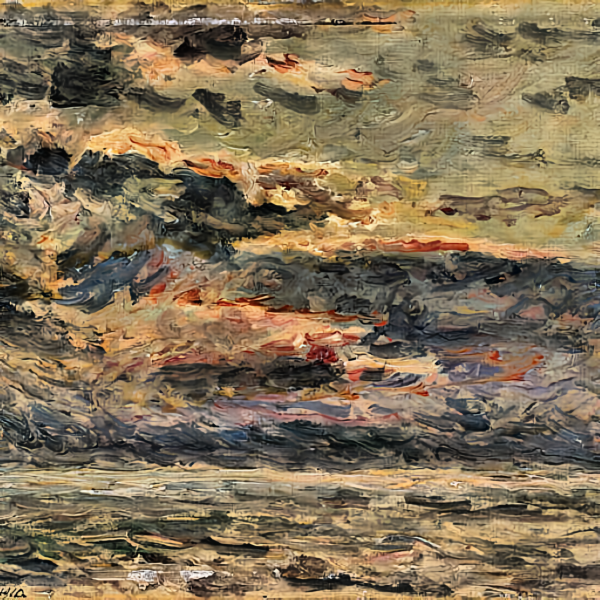

In [10]:
img

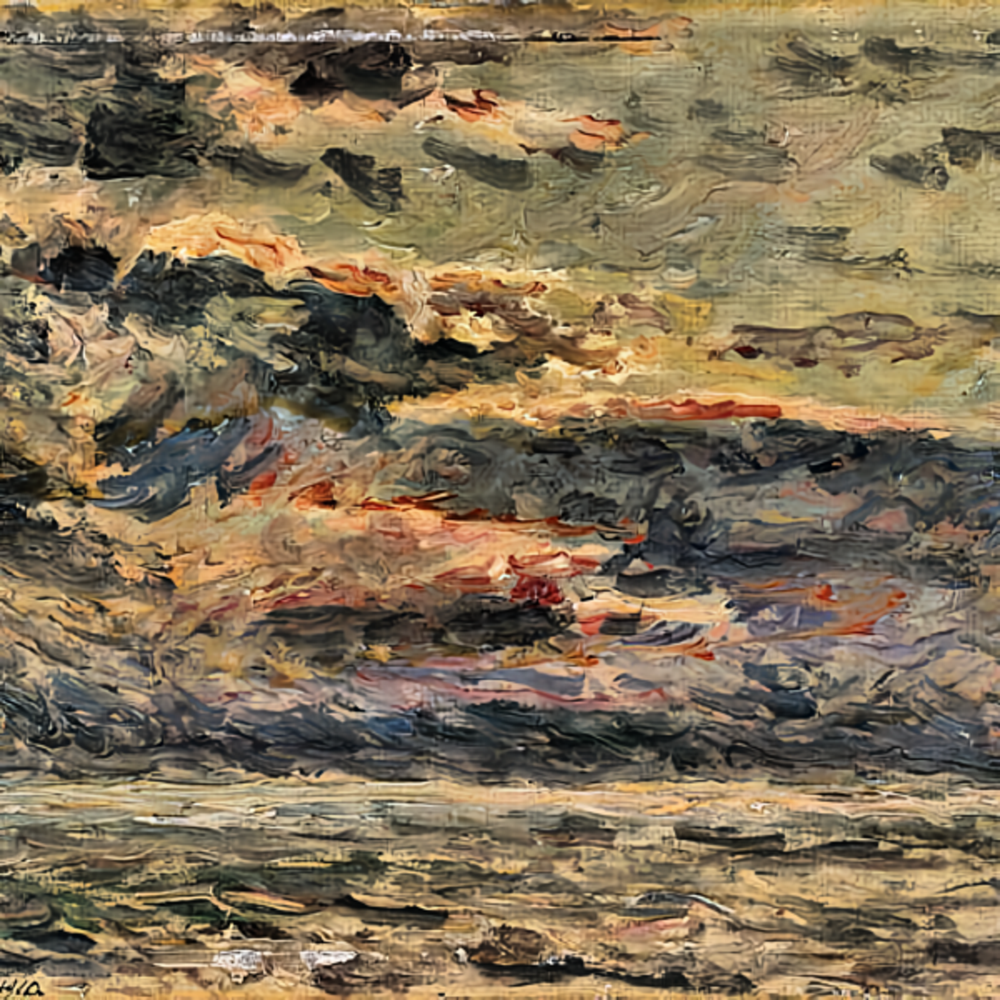

In [11]:
img.resize(size=(img.size[0]*4, img.size[1]*4), resample=Image.BICUBIC)


In [12]:
#!pip install patchify


In [13]:
#from patchify import patchify, unpatchify


In [14]:
np.array(img).shape

(600, 600, 3)

In [15]:
#patches = patchify(np.array(img), (60, 60, 3), step=600)


In [16]:
#!pip install image_slicer

In [20]:
img = np.array(img)

In [21]:
img.shape

(600, 600, 3)

In [22]:
from skimage.util.shape import view_as_blocks

In [23]:
r = view_as_blocks(img, (60, 60, 3))

In [24]:
r.shape

(10, 10, 1, 60, 60, 3)

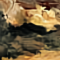

In [25]:
Image.fromarray(r[3,4, 0,:, :, :].astype(np.uint8))

In [37]:
from scipy import ndimage as ndi


In [11]:
imgs_parts.shape

(10, 60, 60, 3)

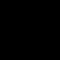

In [13]:
Image.fromarray(imgs_parts[1, :, :, :].astype(np.uint8))

In [27]:
from tqdm import trange, tqdm

In [28]:
predicted_image = np.zeros((2400, 2400, 3))
for i in trange(r.shape[0]):
    for j in trange(r.shape[1]):
        pred = rrdn.predict(r[i, j, 0, :, :, :])
        ini_i = i * 240
        end_i = (i+1)*240
        ini_j = j*240
        end_j = (j+1)*240
        predicted_image[ini_i:end_i, ini_j:end_j, :] = pred

100%|██████████| 10/10 [00:36<00:00,  3.60s/it]


In [29]:
predicted_image.dtype

dtype('float64')

In [30]:
predicted_image = predicted_image.astype(np.uint8)

In [32]:
im = Image.fromarray(predicted_image)

In [33]:
im.save("prueba.png")

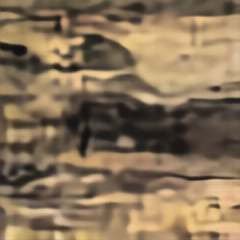

In [14]:

sr_img = rrdn.predict(imgs_parts[0,:,:,:])
Image.fromarray(sr_img)

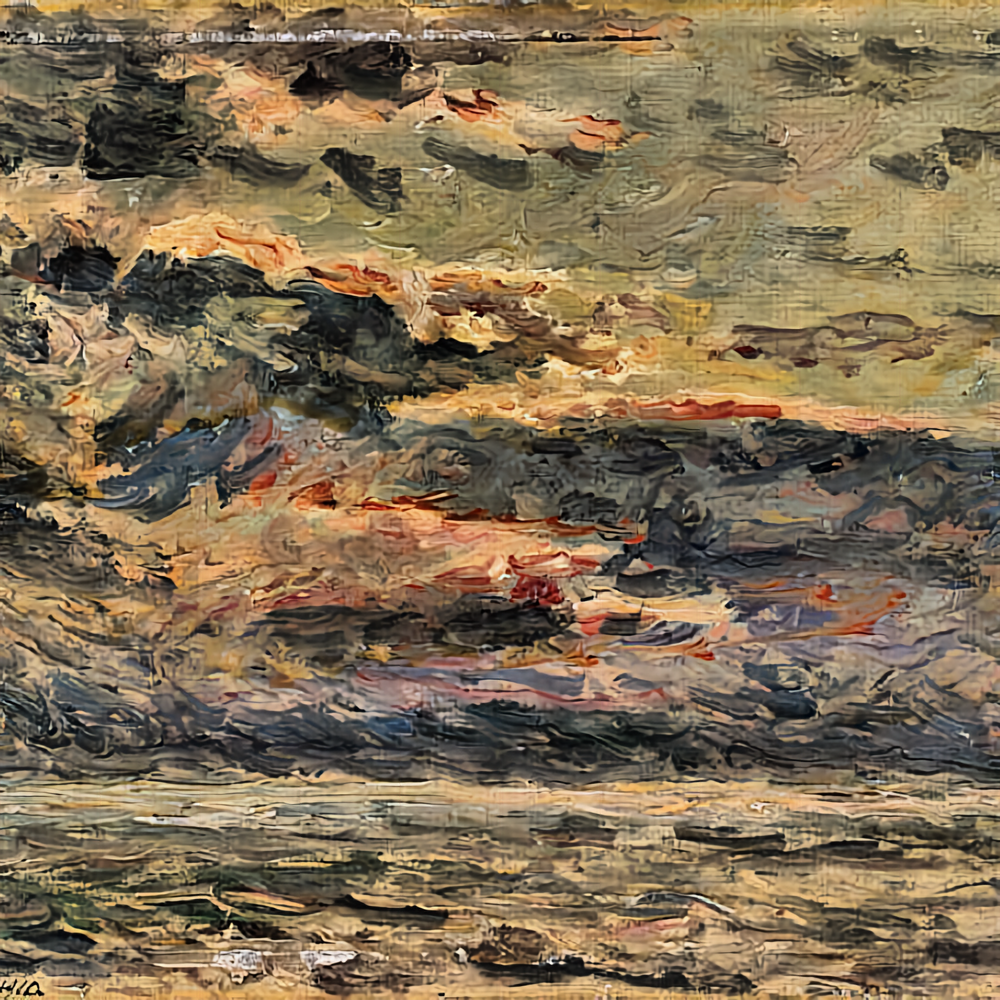

In [34]:
im

In [13]:
from ISR.predict import Predictor
rrdn  = RRDN(arch_params={'C':4, 'D':3, 'G':32, 'G0':32, 'T': 10, 'x':4}, patch_size=60)
predictor = Predictor(input_dir='test_data/input/')
predictor.get_predictions(model=rrdn, weights_path='weights/rrdn-C4-D3-G32-G032-T10-x4/2021-03-05_1158/rrdn-C4-D3-G32-G032-T10-x4_epoch009.hdf5')

Loaded weights from 
 > weights/rrdn-C4-D3-G32-G032-T10-x4/2021-03-05_1158/rrdn-C4-D3-G32-G032-T10-x4_epoch009.hdf5
Results in:
 > data/output/input/rrdn-C4-D3-G32-G032-T10-x4/2021-03-07_1848
Processing file
 > test_data/input/0630.png


ValueError: Error when checking input: expected LR_input to have shape (60, 60, 3) but got array with shape (600, 600, 3)

In [34]:
from pathlib import PosixPath

In [44]:
import tensorflow as tf

In [45]:
tf.__version__

'1.14.0'

In [46]:
#!pip install tensorflow-gpu